In [1]:
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image
from pathlib import Path
import sys
import rasterio

In [2]:
from remoteFunctions import myplot, myStretch
import kmeansFun as km

brc image: (11, 3804, 1250)
rcb image: (3804, 1250, 11)


<Figure size 720x720 with 0 Axes>

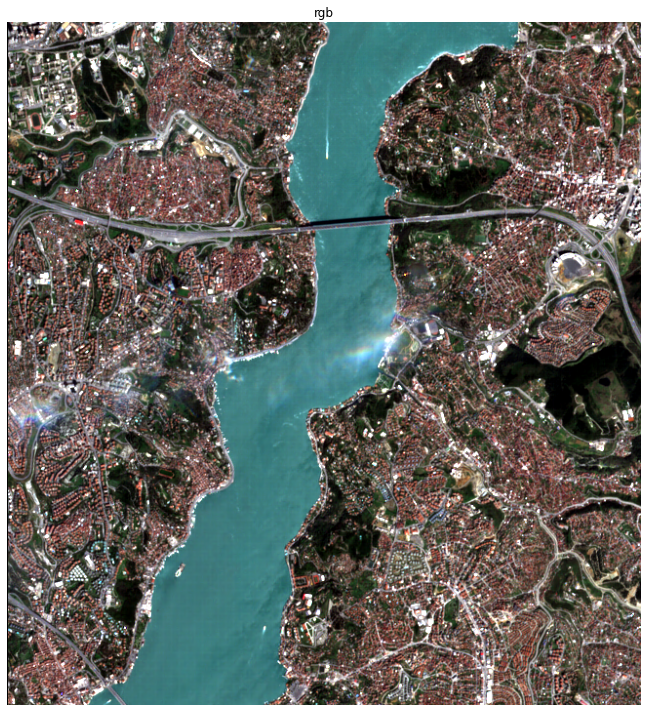

In [3]:
ad = 'cliped_Cevizlibağ_Üsküdar.tif'
ar = rasterio.open(ad).read()
print(f'brc image: {ar.shape}')

# update data with Sentinel coeficient - 1/10000
ar = np.array(ar/10000,dtype = np.float32)

# convert to rows cols bands
ar = np.transpose(ar.copy(),(1,2,0))
print(f'rcb image: {ar.shape}')

arr = ar.copy()
data = np.reshape(arr,(-1,arr.shape[-1]))
f = plt.figure(figsize=(10,10))
ars = myStretch(arr)
focus=arr[2850:3650,:750,:]
focusS =ars[2850:3650,:750,:]
myplot([ars[2850:3550,:650,[2,1,0]]],title=['rgb'],size=(10,10))


In [4]:
def myIndex(b1,b2,ar):
    ''' Args:
            - b1, b2:   int, bands' numbers
            - ar:       np.array, multibands image
    '''
    ar = ar.copy()
    b1 = ar[:,:,b1].copy()
    b2 = ar[:,:,b2].copy()
    with np.errstate(divide='ignore', invalid='ignore'):
        idx = np.array((b1-b2)/(b1+b2),dtype=np.float32)
        idx[np.isnan(idx)] = 0
        idx[np.isinf(idx)] = 0
    
    return np.round(idx,3)
channels = {'B2':[0,'blue'], 'B3':[1,'green'], 'B4':[2,'red'], 'B5':[3,'red edge'],\
        'B6':[4,'red edge2'], 'B7':[5,'red edge3'], 'B8':[6,'NIR'], 'B8A':[7,'Narrow NIR '],\
        'B11':[8,'SWIR'], 'B12':[9,'SWIR2']}

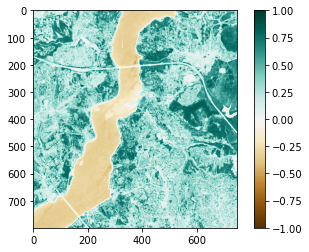

In [5]:
tmp = focus.copy()
with np.errstate(divide='ignore', invalid='ignore'):
    ndvi = (tmp[:,:,6] - tmp[:,:,2])/(tmp[:,:,6] + tmp[:,:,2])
    ndvi[np.isnan(ndvi)] = 0
del tmp
plt.imshow(ndvi,cmap=plt.cm.BrBG);
plt.colorbar();

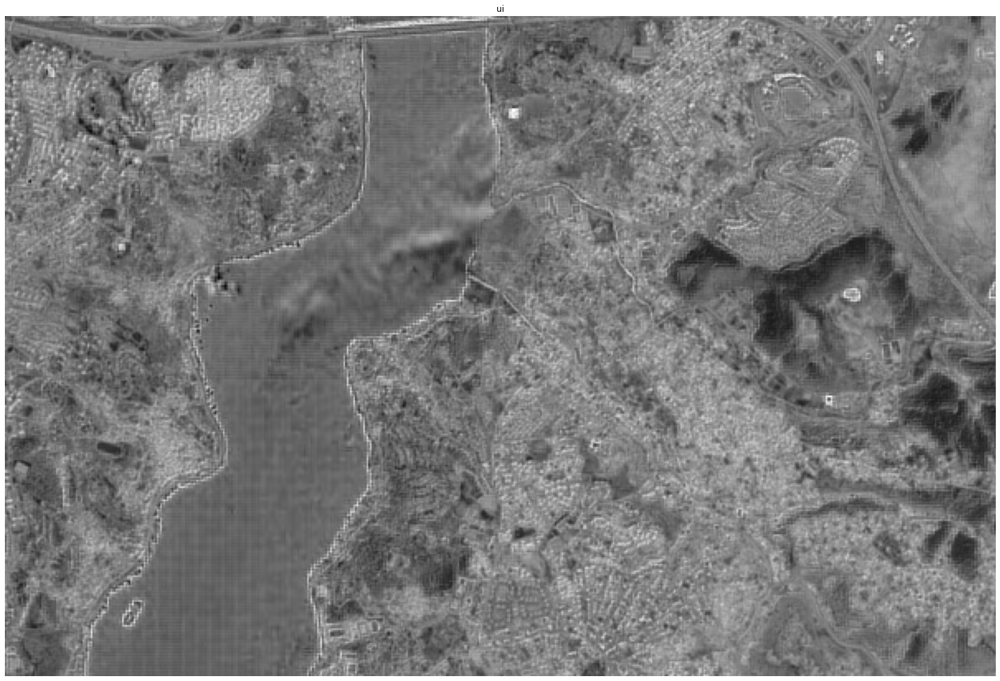

In [6]:
urbanIndex = myIndex(9,6,focus) + 1
myplot([urbanIndex[200:600,100:700]],title=['ui'],size=(20,20))


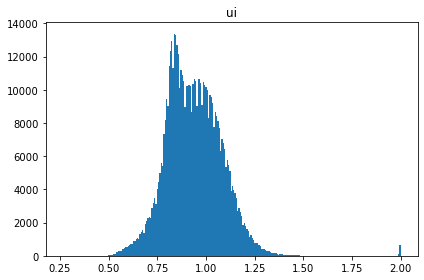

In [7]:
myplot([urbanIndex],title=['ui'],hist=1)

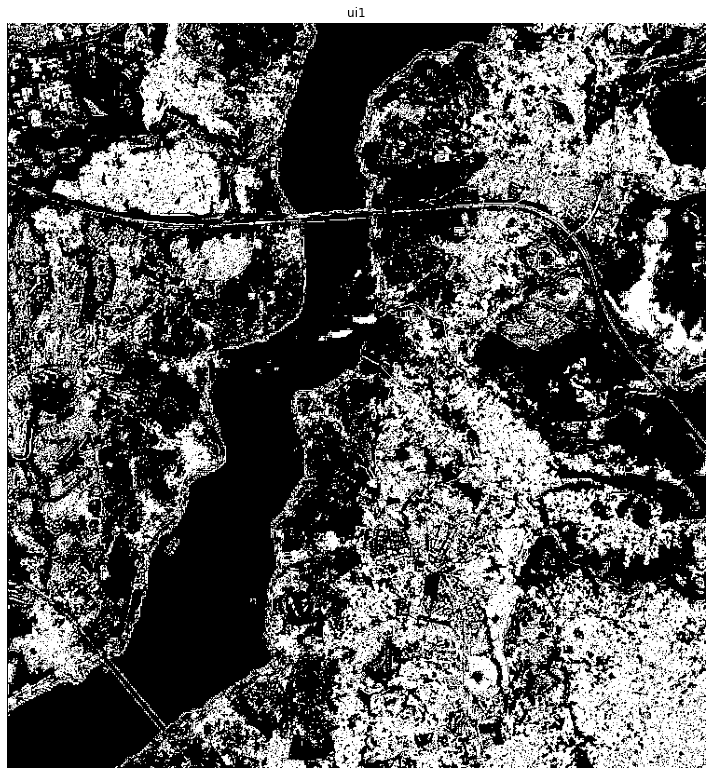

In [8]:
# reclass - > 1 - 1
urbanIndex1 = urbanIndex.copy()
urbanIndex1[urbanIndex>1] = 1
urbanIndex1[urbanIndex<1] = 0
urbanIndex1[urbanIndex>1.25] = 0
myplot([urbanIndex1],title=['ui1'],size=(10,15))

In [9]:
bai = myIndex(0,6,focus)

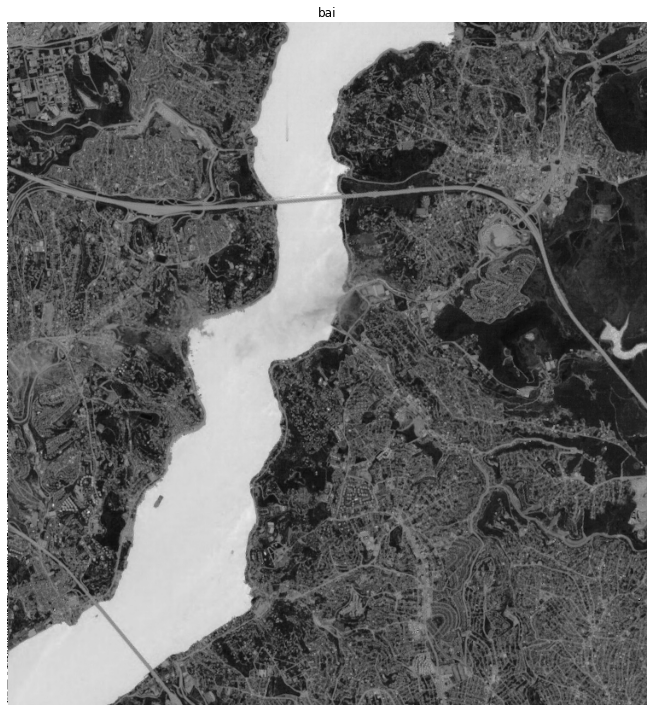

In [10]:
myplot([bai],title=['bai'],size=(10,10))

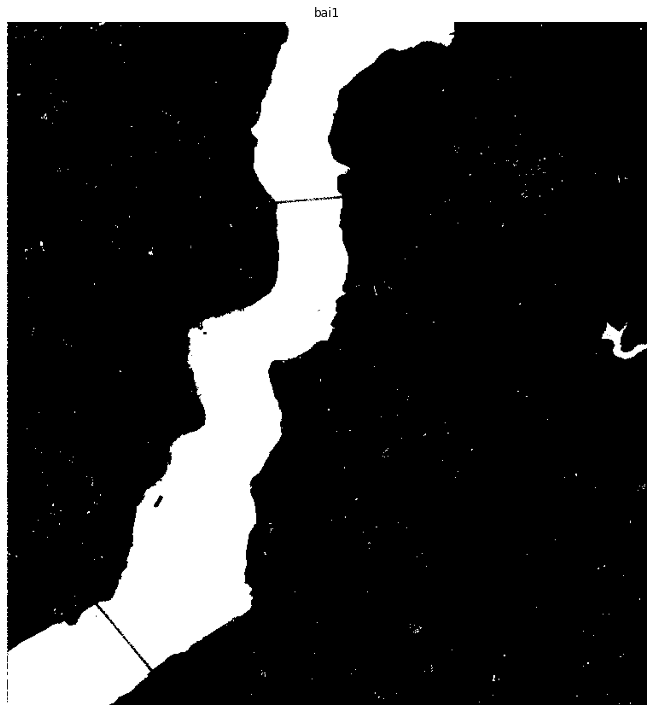

In [11]:
bai1 = bai.copy()
bai1[bai>0] = 1
bai1[bai<0] = 0
myplot([bai1],title=['bai1'],size=(10,10))

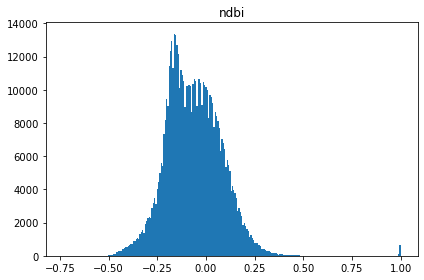

In [12]:
# NDBI - normalized differencial built-up index: (SWIR2 - NIR)/(SWIR2 + NIR)
ndbi = myIndex(9,6,focus)
myplot([ndbi],title=['ndbi'],hist=1)

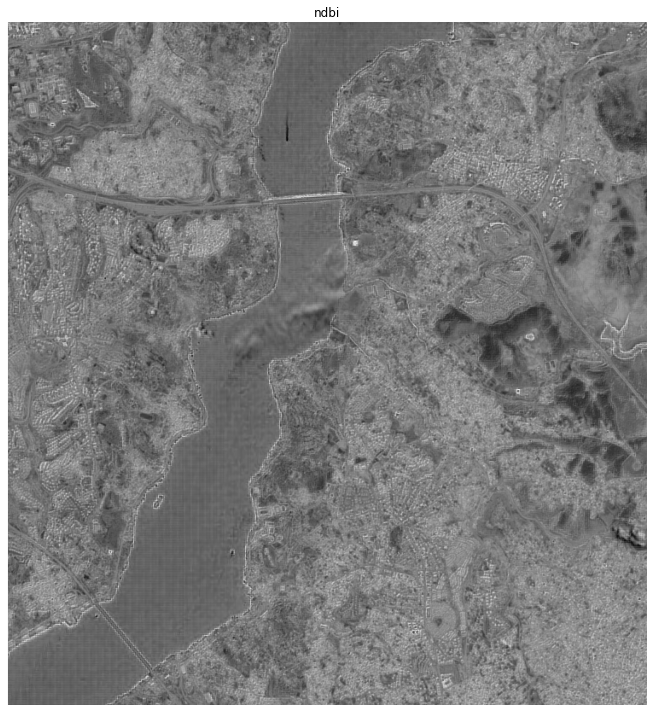

In [13]:
myplot([ndbi],title=['ndbi'],size=(10,10))

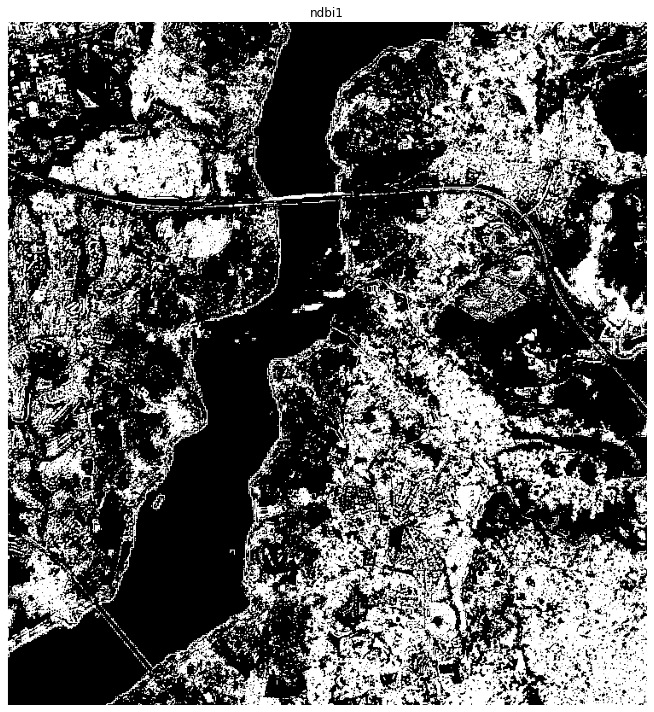

In [14]:
ndbi1 = ndbi.copy()
ndbi1[ndbi>0] = 1
ndbi1[ndbi<0] = 0
myplot([ndbi1],title=['ndbi1'],size=(10,10))

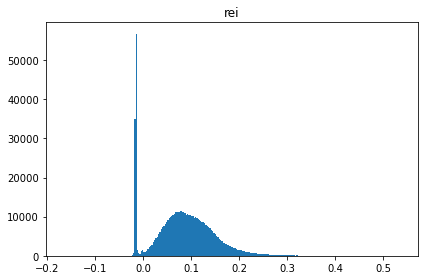

In [15]:
# REI - road extraction index: ((NIR2 - Blue)/(NIR2 + Blue)) * NIR2
rei = myIndex(6,0,focus) *focus[:,:,6]
myplot([rei],title=['rei'],hist=1)

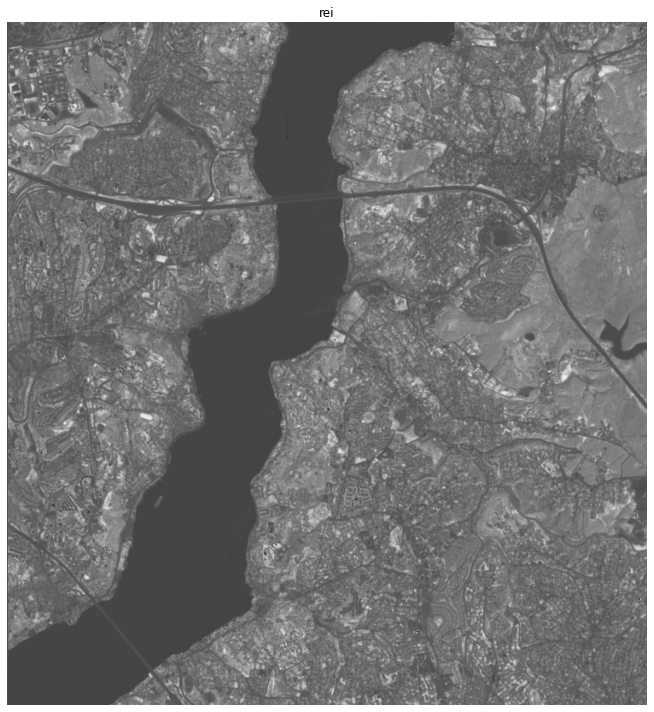

In [16]:
myplot([rei],title=['rei'],size=(10,10))

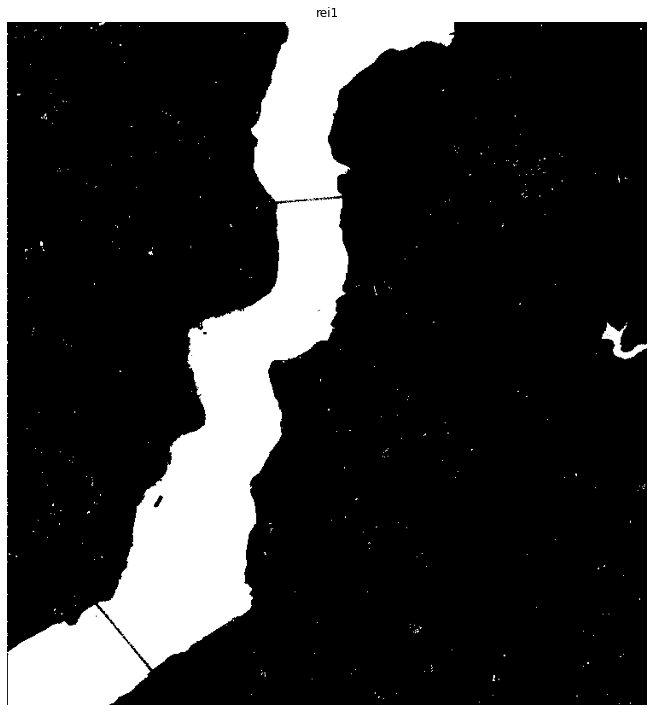

In [48]:
rei1 = rei.copy()
rei1[rei<0] = 1
rei1[rei>0] = 0
myplot([rei1],title=['rei1'],size=(10,10))

In [18]:
# NDWI_1 - normalized differencial water index: (NIR - SWIR)/(NIR + SWIR)
ndwi1 = myIndex(6,8,focusS)
# NDWI_2 - normalized differencial water index: (Green - NIR)/(Green + NIR)
ndwi2 = myIndex(1,6,focusS)

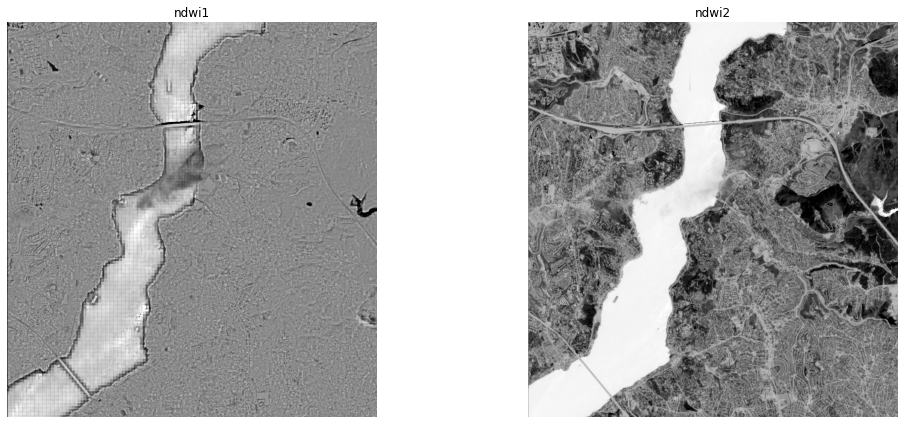

In [19]:
myplot([ndwi1,ndwi2],title=['ndwi1','ndwi2'],size=(16,6))

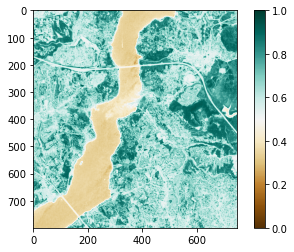

In [20]:
ndvi1 = (ndvi-ndvi.min())/2
plt.imshow(ndvi1,cmap=plt.cm.BrBG);
plt.colorbar();

In [21]:
stackAr = np.array([urbanIndex1,ndvi,bai1,ndbi1,rei1,ndwi1,ndwi2])
stackAr = np.transpose(stackAr.copy(),(1,2,0))
# convert array to data
data = np.reshape(stackAr,(-1,stackAr.shape[-1]))

In [52]:
print(f'shape of stack{stackAr.shape}')
print(f'shape of ui{urbanIndex1.shape}')
print(f'shape of data{data.shape}')

shape of stack(800, 750, 7)
shape of ui(800, 750)
shape of data(600000, 7)


In [29]:
k = 4
l,c,ci = km.myKmeans(data,k,n=100,init=1)
rows,cols = stackAr.shape[:2]
clusters1 = np.reshape(l,(rows,cols))

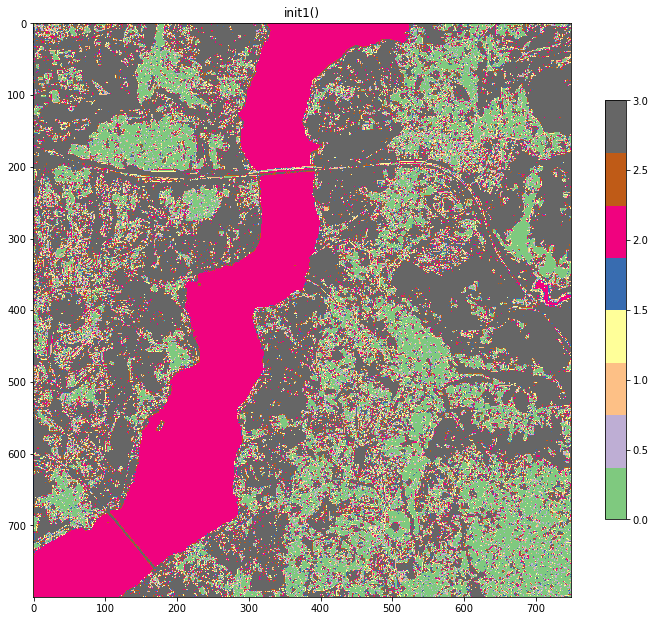

In [30]:
f = plt.figure(figsize=(10,10))
tmp=plt.imshow(clusters1,cmap=plt.cm.Accent);
plt.title(f'init1()');
f.colorbar(tmp, shrink=0.6);
plt.tight_layout();

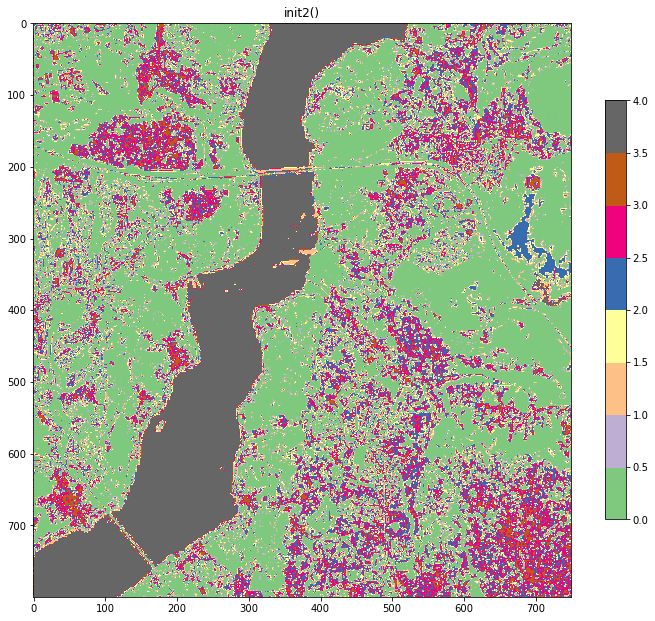

In [25]:
# init2()
k = 5
l,c,ci = km.myKmeans(data,k,n=100,init=2)
rows,cols = stackAr.shape[:2]
clusters2 = np.reshape(l,(rows,cols))
f = plt.figure(figsize=(10,10))
tmp = plt.imshow(clusters2,cmap=plt.cm.Accent);
plt.title(f'init2()');
f.colorbar(tmp, shrink=0.6);
plt.tight_layout()


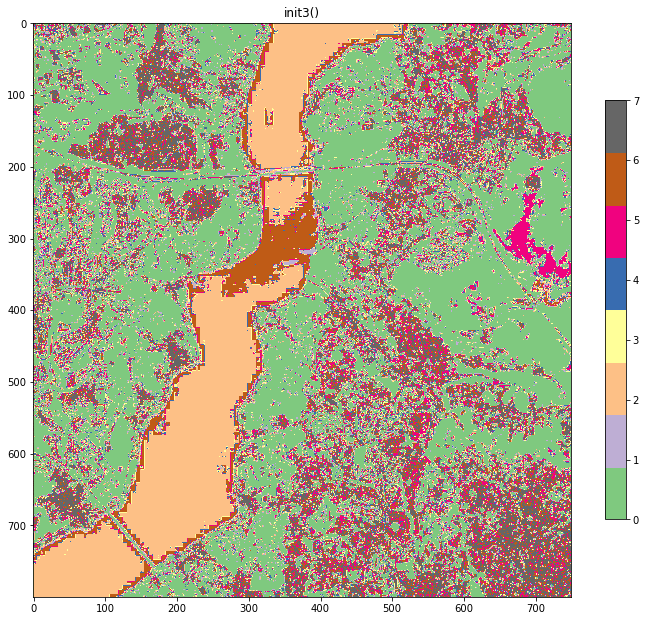

In [50]:
# init3()
k=8
l,c,ci = km.myKmeans(data,k,n=500,init=3)
rows,cols = stackAr.shape[:2]
clusters3 = np.reshape(l,(rows,cols))
f = plt.figure(figsize=(10,10))
tmp=plt.imshow(clusters3,cmap=plt.cm.Accent);
plt.title(f'init3()');
f.colorbar(tmp, shrink=0.6);
plt.tight_layout();

<Figure size 1080x1080 with 0 Axes>

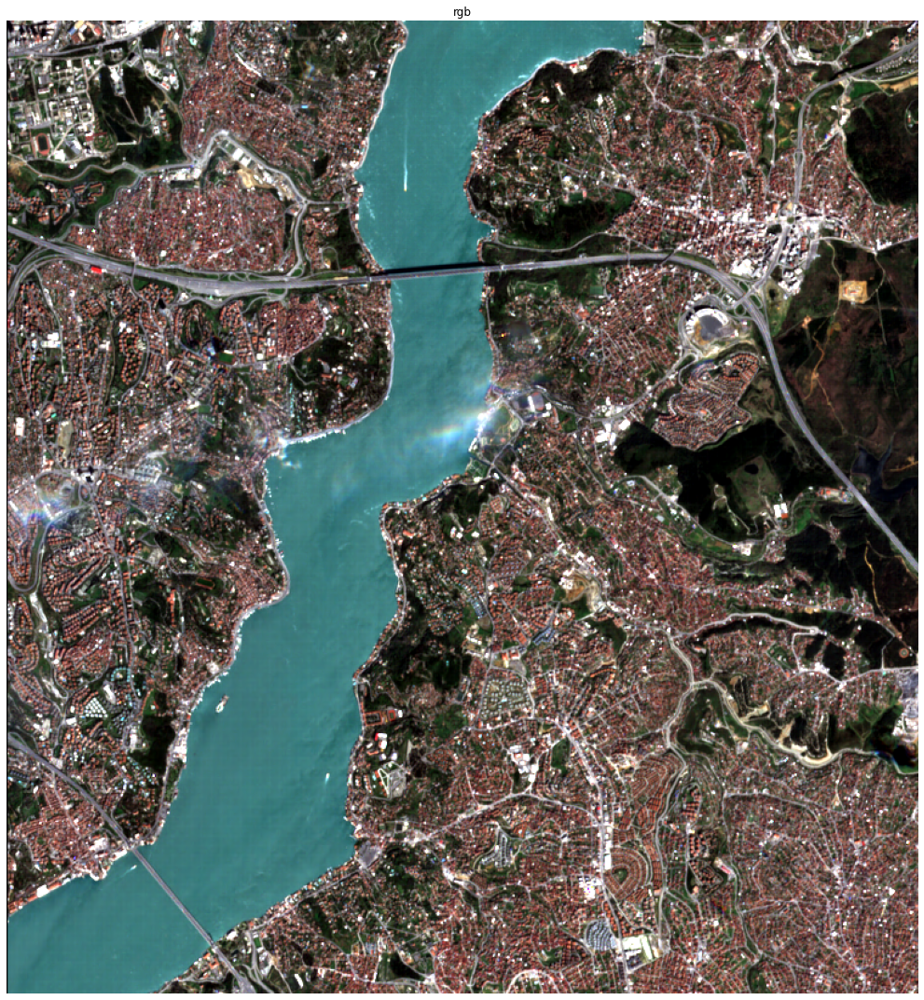

In [46]:
f = plt.figure(figsize=(15,15))
myplot([focusS[:,:,[2,1,0]]],title=['rgb'],size=(15,15))

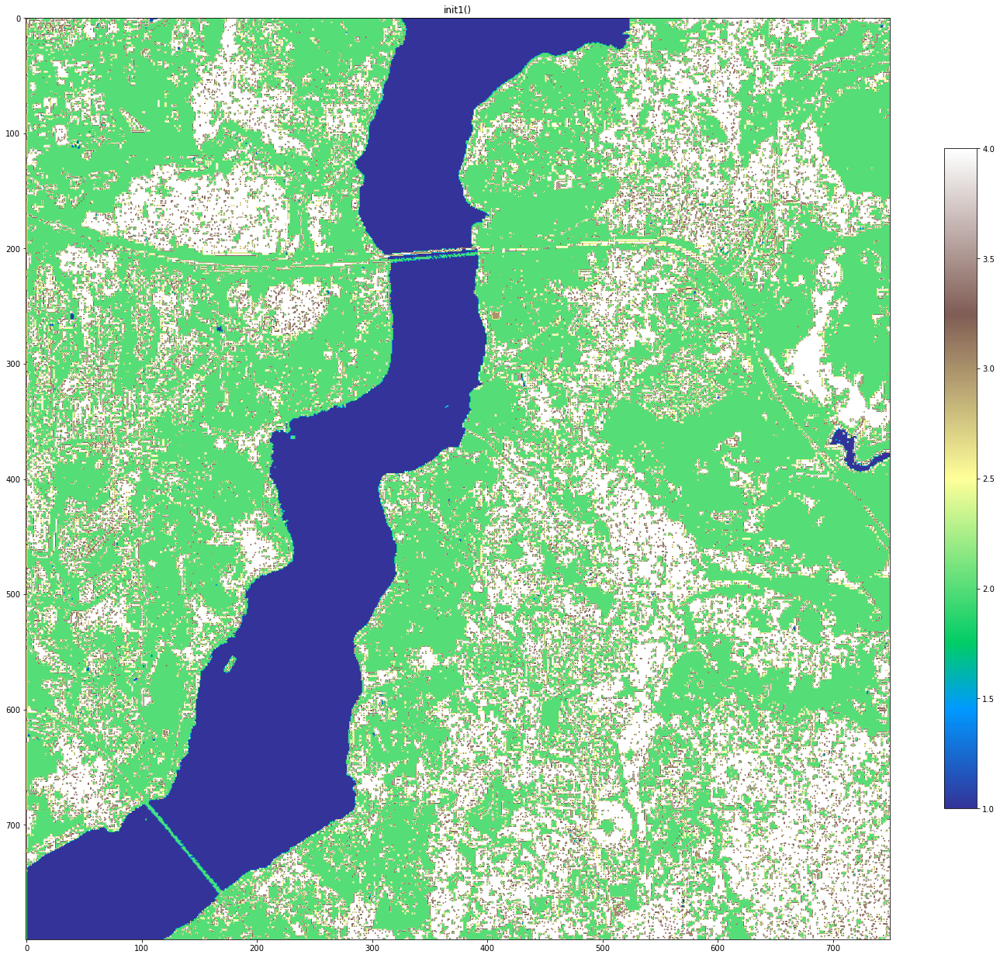

In [51]:
names = ['water','forest','other','urban']
code = [1,2,3,4]

current = [2,3,1,0]

reclass1 = np.zeros_like(clusters1,dtype=np.uint8)
for i in range(len(current)):
    reclass1[clusters1==current[i]] = code[i]
    
f = plt.figure(figsize=(20,20))

tmp=plt.imshow(reclass1,cmap=plt.cm.terrain);
plt.title(f'init1()');
f.colorbar(tmp, shrink=0.6);
plt.tight_layout();  